<a href="https://colab.research.google.com/github/omdena/forestfire/blob/master/data_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Data Cleaning

#### Download data

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
import pandas as pd
import numpy as np

import os

import random 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
sns.set()

forestfire_folder_path = 'drive/My Drive/omdena-forestfire/'

In [0]:
# Choose what dataset folder to use: IP or TTG_TUR
folder = 'TTG_TUR'

In [0]:
# Read files from csv, replace url with your file location path
df = pd.read_csv(forestfire_folder_path + folder + '.csv')

In [14]:
# Dataset size
print(df.shape)

# Few dataset examples
df.sample(5)

(7545, 3)


,DATA,DETECCAO,TORRE
132,2018-01-30 10:59:20,SIM,T1
6034,2018-03-20 05:56:18,NAO,T2 - Cai�ara
6426,2018-03-20 14:34:48,NAO,T2 - Cai�ara
583,2018-03-01 22:37:18,NAO,T2 - Cai�ara
2747,2018-03-13 14:17:38,NAO,T2 - Cai�ara


#### Create clean dataframe

In [15]:
num_imgs_folder = len(os.listdir(forestfire_folder_path + folder))
num_imgs_db = df.shape[0]
print('There is a misalignment of ' + str(abs(num_imgs_folder - num_imgs_db)) + ' images between the folder and the database')

There is a misalignment of 19 images between the folder and the database


In [0]:
# Specify the minimum intensity for daytime images
min_img_intensity = 106.4

In [0]:
def get_img_intensity(img_path_file):
  return mpimg.imread(img_path_file).mean()

In [18]:
%%time

imgs, deteccaos, torres, caras = [], [], [], []

for _, row in df.iterrows():
  img_file, deteccao = row[0], row[1]
  img_file = img_file.replace(':', '-') + '_' + deteccao + '.jpeg'
  img_path_file = forestfire_folder_path + folder + '/' + img_file

  if os.path.isfile(img_path_file) and get_img_intensity(img_path_file) >= min_img_intensity:
    torre, cara = row[2][:2], row[2][5:]
    imgs.append(img_file)
    deteccao = 1 if deteccao == 'SIM' else 0
    deteccaos.append(deteccao)
    torres.append(torre)
    caras.append(cara)

df = pd.DataFrame({'img': imgs, 'deteccao': deteccaos, 'torre': torres, 'cara': caras})

CPU times: user 5min 39s, sys: 5.86 s, total: 5min 45s
Wall time: 6min 5s


In [19]:
df.head()

,img,deteccao,torre,cara
0,2017-12-12 11-53-41_SIM.jpeg,1,T1,TORRE S1
1,2017-12-12 11-54-05_NAO.jpeg,0,T1,TORRE S1
2,2017-12-12 11-54-15_SIM.jpeg,1,T1,TORRE S1
3,2017-12-12 11-55-28_SIM.jpeg,1,T1,TORRE S1
4,2017-12-12 11-56-30_NAO.jpeg,0,T1,TORRE S1


#### Plot some images

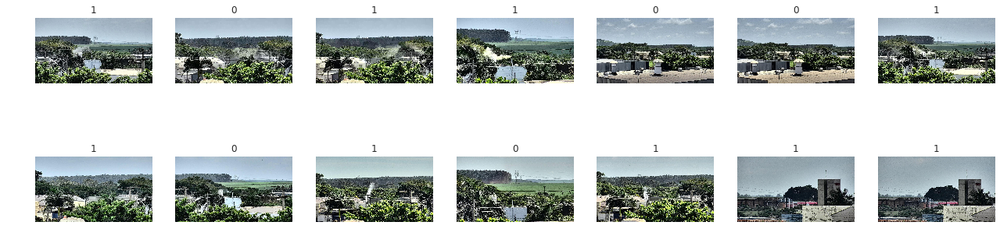

In [20]:
fig, axs = plt.subplots(2, 7, figsize = (22, 6))
ix = 0
for _ax in axs:
  for ax in _ax:
    img, deteccao = df.loc[ix].img, df.loc[ix].deteccao
    img = mpimg.imread(forestfire_folder_path + folder + '/' + img)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(deteccao)
    ix += 1
plt.show()

## Data Exploration

#### Deteccao histogram

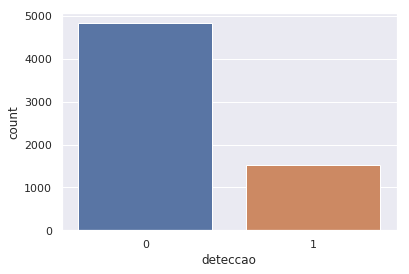

In [21]:
ax = sns.countplot(df['deteccao'])

#### Torre histogram

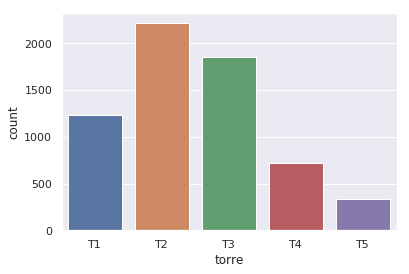

In [22]:
ax = sns.countplot(df['torre'].sort_values())

#### Deteccao-Torre histogram

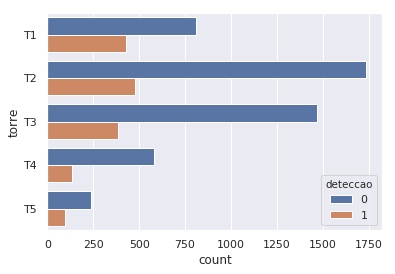

In [23]:
ax = sns.countplot(y=df['torre'].sort_values(), hue="deteccao", data=df)

#### Plot info about towers

In [0]:
def plot_tower_images(df):
  fig, axs = plt.subplots(3, 3, figsize = (24, 10))
  for _ax in axs:
    for ax in _ax:
      ix = random.randint(0, len(df) - 1)
      img, deteccao, cara = df.loc[ix].img, df.loc[ix].deteccao, df.loc[ix].cara
      img = mpimg.imread(forestfire_folder_path + folder + '/' + img)
      ax.imshow(img)
      ax.axis('off')
      ax.set_title('Smoke: ' + str(deteccao) + ' | Cara: ' + cara)
  plt.show()

def plot_tower_info(torre):
  df_torre = df[df.torre == torre]
  df_torre_sim = df_torre[df_torre.deteccao == 1].reset_index()
  df_torre_nao = df_torre[df_torre.deteccao == 0].reset_index()

  print('Tower ' + torre + ' data')
  ax = sns.countplot(x='cara', hue='deteccao', data=df_torre)
  plot_tower_images(df_torre_sim)
  plot_tower_images(df_torre_nao)


##### Tower T1

Tower T1 data


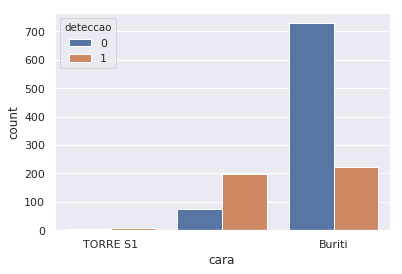

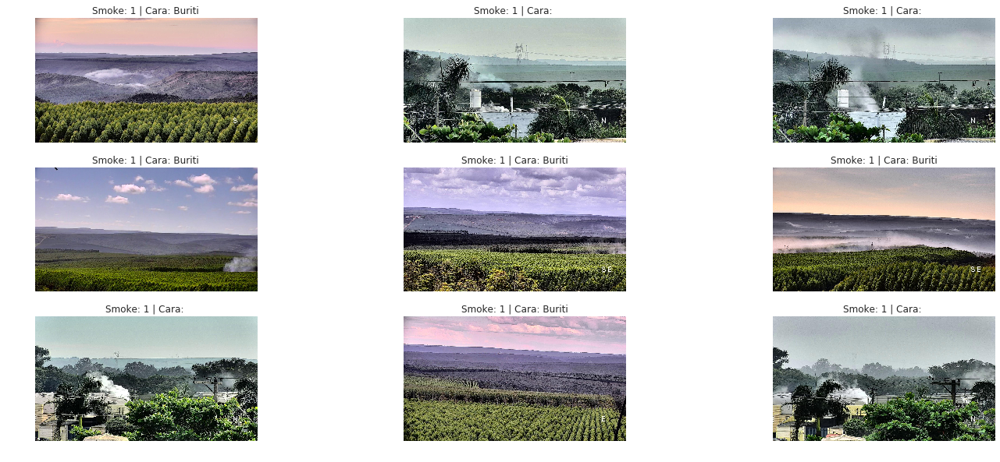

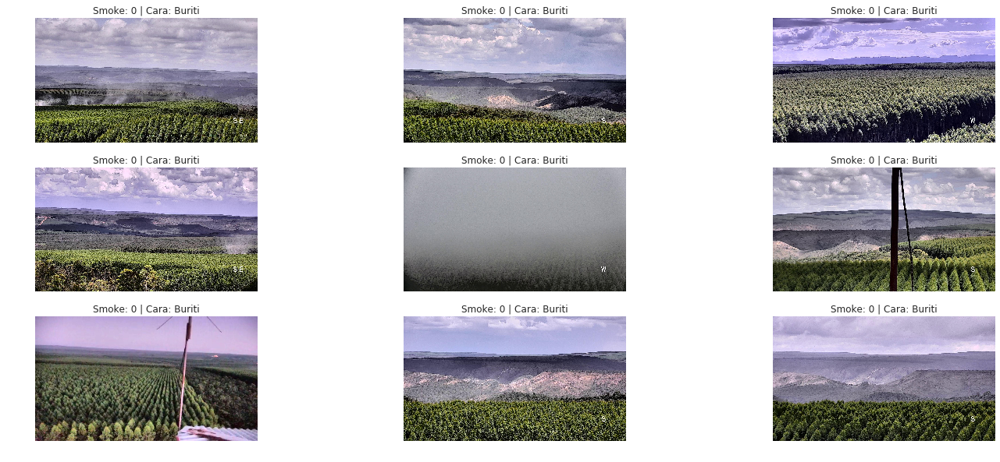

In [25]:
plot_tower_info('T1')

##### Tower T2

Tower T2 data


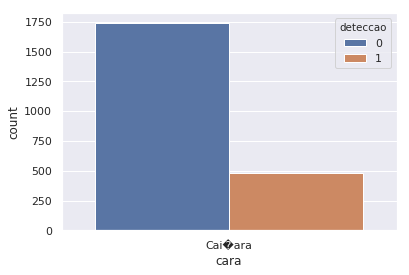

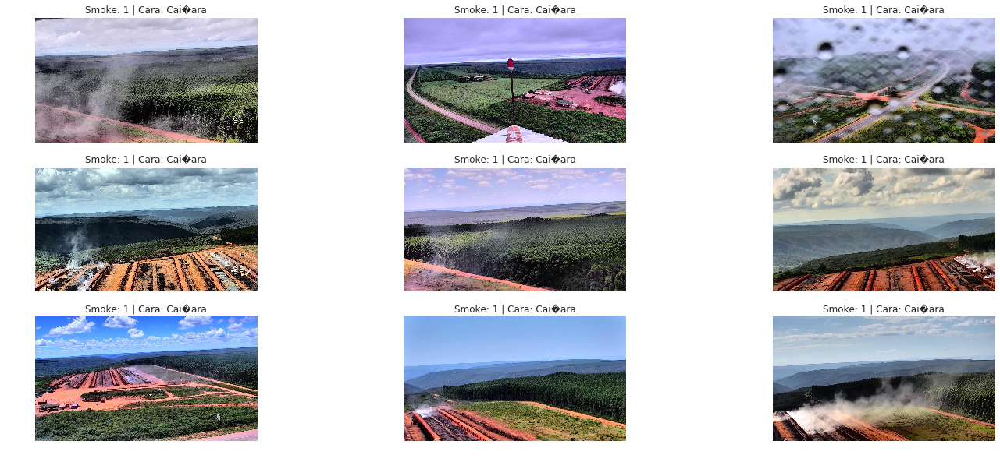

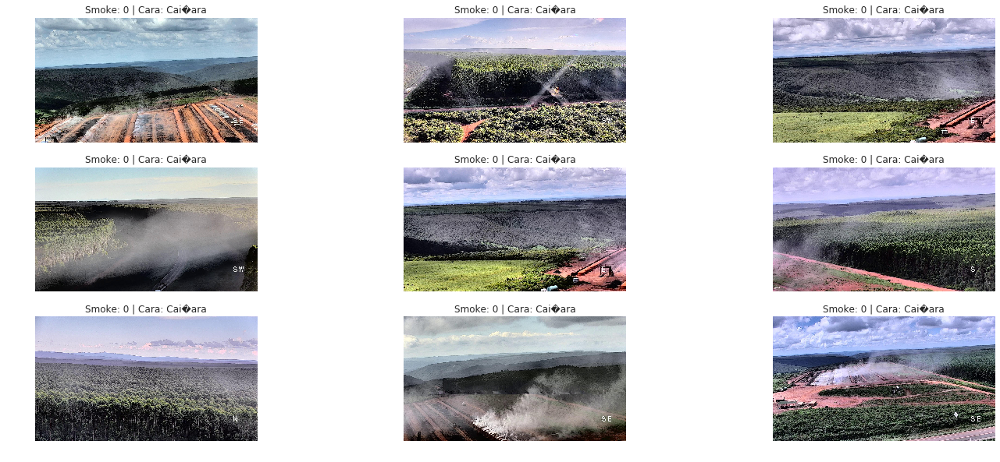

In [26]:
plot_tower_info('T2')

##### Tower T3

Tower T3 data


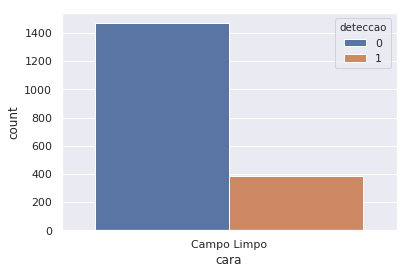

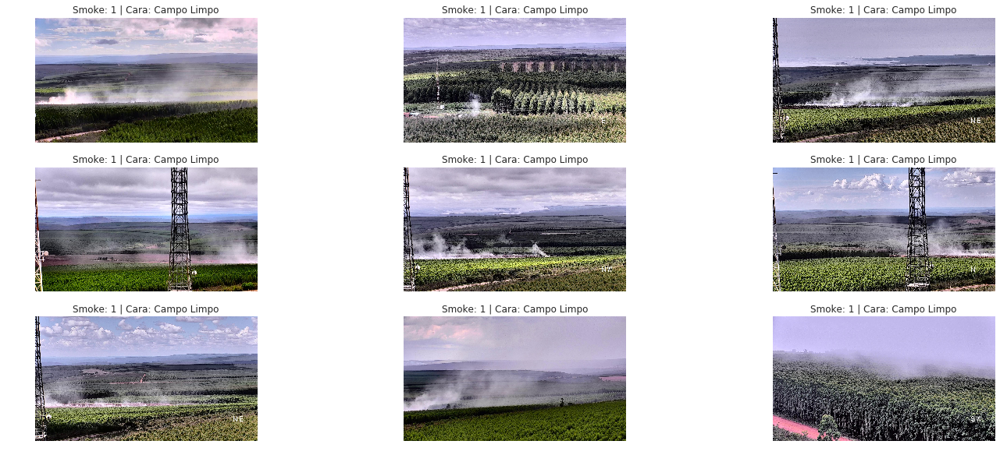

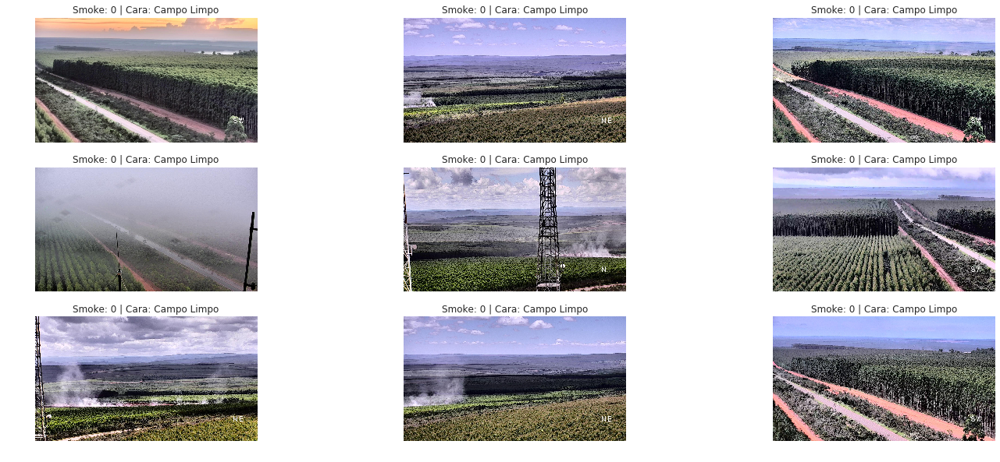

In [27]:
plot_tower_info('T3')

##### Tower T4

Tower T4 data


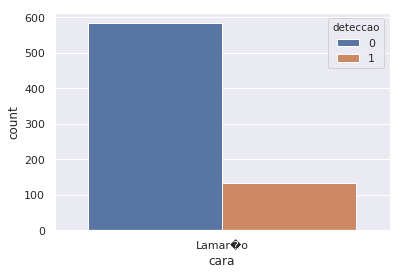

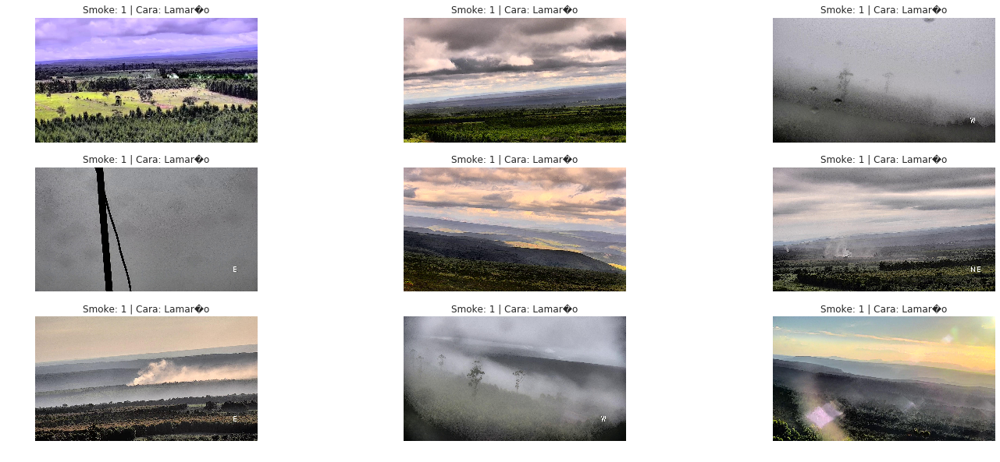

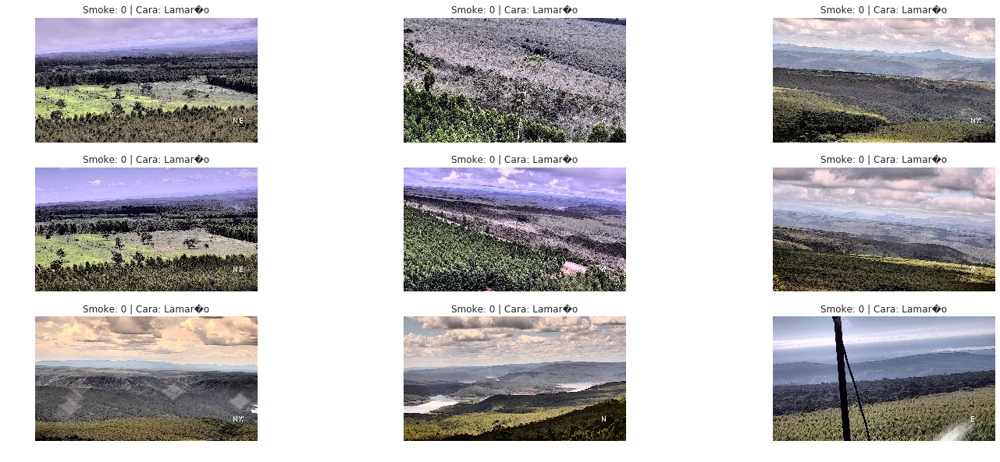

In [28]:
plot_tower_info('T4')

##### Tower T5

Tower T5 data


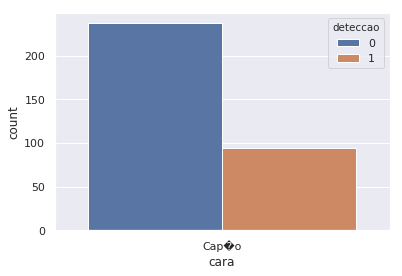

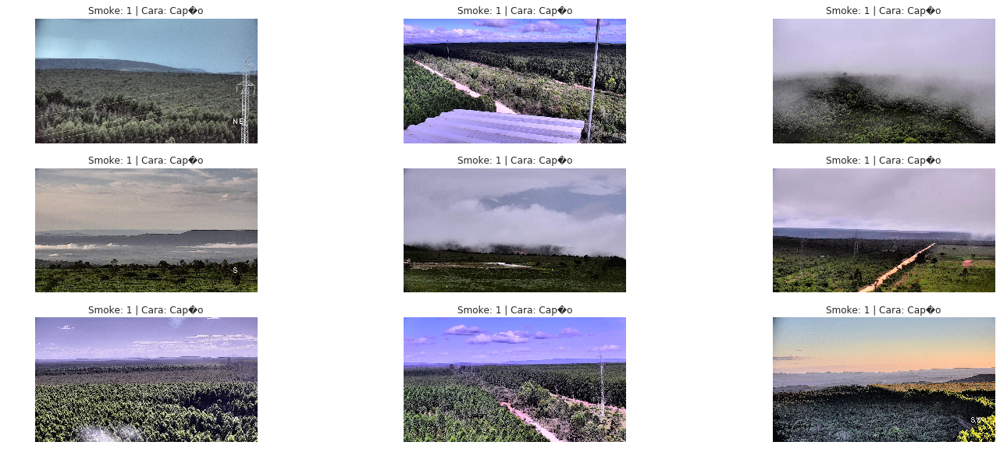

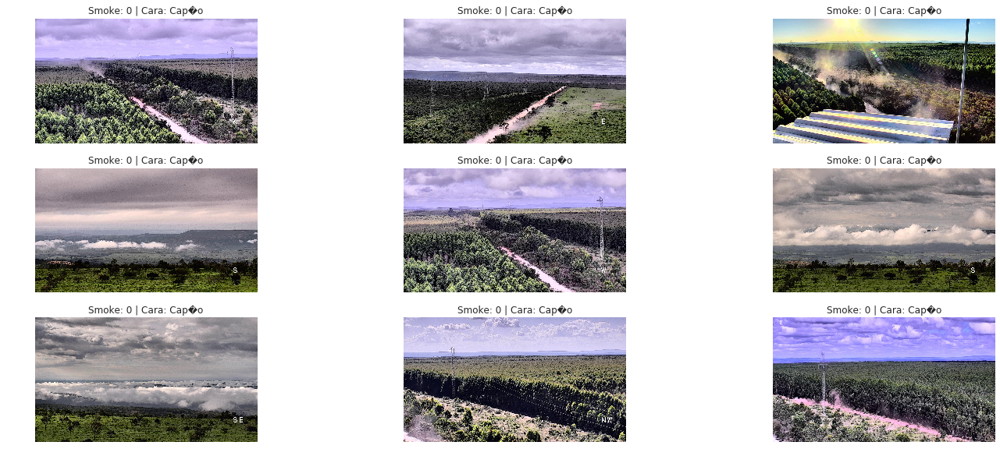

In [29]:
plot_tower_info('T5')